# Notebook for plots from:
# Marine cloud base height retrieval from MODIS cloud properties using machine learning

Lenhardt, J. (1), Quaas, J. (1, 2), Sejdinovic, D. (3)

1 Leipzig Institute for Meteorology, Leipzig University, Leipzig, Germany

2 ScaDS.AI - Center for Scalable Data Analytics and Artificial Intelligence, Leipzig University, Humboldtstraße 25, 04105 Leipzig, Germany

3 School of Computer and Mathematical Sciences & Australian Institute for Machine Learning, University of Adelaide, Adelaide, Australia


##### Notebook edited by Julien LENHARDT

In [1]:
import os
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cmasher as cmr
import cartopy
import cartopy.crs as ccrs
from ast import literal_eval
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import ImageGrid

from utils_plots import add_label, SeabornFig2Grid, plot_joint_hist_cbh, bin_value_cat

home_dir = os.getcwd().split('plots')[0]
os.chdir(home_dir)

DATA_DIR = home_dir + '/data/'
DATA_DIR_PLOTS = DATA_DIR + 'plots_data/'
PLOT_DIR = home_dir + '/plots/'

In [2]:
import warnings
warnings.filterwarnings('ignore')

## Figure 2 : (a) Global surface observations spatial distribution (years 2008 & 2016) and (b) cloud base height retrievals histogram

In [3]:
# Count of global observations
dfile_global = 'global_occurences_observations_2008-2016.nc'
xr_counts = xr.open_dataset(DATA_DIR_PLOTS + dfile_global)

In [4]:
# Surface observations
dfile_obs_pre_colocation = 'synop_cbh_full_count.csv'
dfile_obs_post_colocation = 'synop_cbh_colocation_count.csv'

df_pre = pd.read_csv(DATA_DIR_PLOTS + dfile_obs_pre_colocation, header=0, index_col=0)
# Rework classes for the plot
df_pre = df_pre[df_pre.CLD_BASE_HT > 0.]
df_pre['CLD_BASE_HT'] = df_pre['CLD_BASE_HT'] * 10.
df_pre.loc[df_pre.CLD_BASE_HT <= 50., 'CLD_BASE_HT'] = 50.

df_post = pd.read_csv(DATA_DIR_PLOTS + dfile_obs_post_colocation, header=0, index_col=0)
# Rework classes for the plot
df_post = df_post[df_post.CLD_BASE_HT > 0.]
df_post.loc[df_post.CLD_BASE_HT <= 50., 'CLD_BASE_HT'] = 50.

In [5]:
cbh_max = 2600.
classes = np.array([50., 100., 200., 300., 600., 1000., 1500., 2000., 2500.])

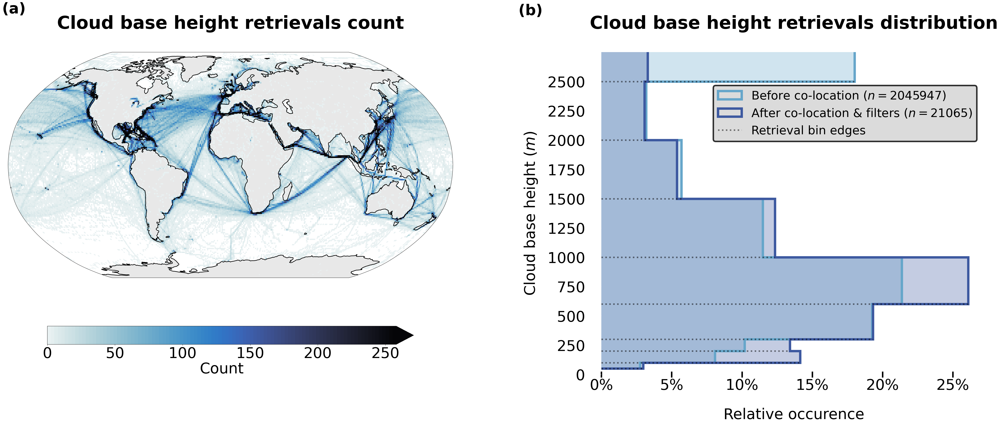

In [6]:
labelsize = 50
ticksize = 50
titlesize = 50
legendsize = 40
fig = plt.figure(figsize=(50, 20))
gs = fig.add_gridspec(1, 5)
# region Plot observation count
ax1 = fig.add_subplot(gs[0, :3], projection=ccrs.Robinson(central_longitude=0.))
subplot_kws = dict(projection=ccrs.Robinson(central_longitude=0.))
cbar_kws = dict(shrink=0.6, extend='max', label='Count', orientation='horizontal', location='bottom')
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=100, start=0.05, stop=0.95)
p = xr_counts.global_count_cbh_1deg.where(xr_counts.global_count_cbh_1deg > 0.).plot.pcolormesh(
    x='lon1', y='lat1', cmap=cmap,
    robust=True, vmin=0.,
    subplot_kws=subplot_kws,
    add_colorbar=True,
    cbar_kwargs=cbar_kws,
    transform=ccrs.PlateCarree())
p.axes.set_global()
p.axes.coastlines(color='black', alpha=1., lw=2.)
p.axes.add_feature(cartopy.feature.LAND, color='lightgray', alpha=0.5)
p.colorbar.ax.tick_params(labelsize=ticksize)
p.colorbar.set_label(label='Count', fontsize=labelsize)
p.axes.set_title('Cloud base height retrievals count',
                 fontsize=titlesize + 10, pad=80, weight='bold')
add_label('(a)', y=1.15, x=0., fontsize=50, weight='bold')
# endregion
# region Plot CBH observations histogram
ax2 = fig.add_subplot(gs[0, 3:])
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=10, start=0.15, stop=0.95)
color = cmr.take_cmap_colors('cmr.arctic_r', 10, cmap_range=(0.15, 0.95), return_fmt='hex')[5]
color2 = cmr.take_cmap_colors('cmr.arctic_r', 10, cmap_range=(0.15, 0.95), return_fmt='hex')[2]
bins = sorted(df_post['CLD_BASE_HT'].unique()) + [3000.]
weights = [np.ones_like(df_post.CLD_BASE_HT.values) / len(df_post),
           np.ones_like(df_pre.CLD_BASE_HT.values) / len(df_pre)]
ax = ax2
hist = ax2.hist([df_post.CLD_BASE_HT.values, df_pre.CLD_BASE_HT.values],
                color=[color, color2], weights=weights, alpha=0.3,
                bins=bins, density=False, stacked=False,
                histtype='stepfilled', orientation='horizontal')
ax2.hist([df_post.CLD_BASE_HT.values, df_pre.CLD_BASE_HT.values],
         color=[color, color2], weights=weights, linewidth=8,
         bins=bins, density=False, stacked=False, histtype='step', orientation='horizontal',
         label=['After co-location & filters ($n = ${})'.format(len(df_post)),
                'Before co-location ($n = ${})'.format(len(df_pre))])
hist_max = hist[0].max(axis=0)
for i, bin in enumerate(bins[:-1]):
    ax2.hlines(y=bin, xmin=0, xmax=hist_max[i], lw=5, color='k', alpha=0.5, ls=':')
ax2.hlines(y=bins[-1], xmin=0, xmax=hist_max[-1], lw=5, color='k', alpha=0.5, ls=':',
           label='Retrieval bin edges')
ax2.set_ylim([0., 2750.])
ax2.set_ylabel('Cloud base height ($m$)', fontsize=labelsize)
ax2.set_yticks(np.arange(0., 2750., 250.),
               [str(int(a)) + '   ' for a in np.arange(0., 2750., 250.)],
               fontsize=ticksize)
ax2.tick_params(axis='y', color='white')
ax2.yaxis.labelpad = 30
ax2.set_xlabel('Relative occurence', fontsize=labelsize)
ax2.set_xticks(np.arange(0., hist_max.max(), 0.05),
               [str(int(100. * a)) + '%'for a in np.arange(0., hist_max.max(), 0.05)],
               fontsize=ticksize)
ax2.tick_params(axis='x', width=5, length=20, direction='inout', color='black')
ax2.xaxis.labelpad = 50
ax2.set_title('Cloud base height retrievals distribution',
              fontsize=titlesize + 10, pad=80, weight='bold')
legend = ax2.legend(fontsize=legendsize,
                    loc='upper right', bbox_to_anchor=(0.99, 0.915),
                    fancybox=True, facecolor='lightgrey', edgecolor='k')
legend.get_frame().set(linewidth=5)
for axis in ['left', 'bottom', 'right', 'top']:
    ax2.spines[axis].set_linewidth(0)
add_label('(b)', y=1.1, x=-0.2, fontsize=50, weight='bold')
# endregion
plt.tight_layout()
plt.savefig(PLOT_DIR + 'figure_2.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

## Figure 3 : (left) Training and validation losses during model optimization. (right) Examples of tiles (first and third rows) with the corresponding reconstructions (second and fourth rows) for the different cloud property channels.

In [7]:
# Loss data
dfile = 'losses_ae_ocean.csv'
losses = pd.read_csv(DATA_DIR_PLOTS + dfile, header=0)

# Examples of tiles input/output
tiles_input = [
    np.load(DATA_DIR_PLOTS + 'samples_reconstruction/input_1.npy')[0],
    np.load(DATA_DIR_PLOTS + 'samples_reconstruction/input_2.npy')[0],
    np.load(DATA_DIR_PLOTS + 'samples_reconstruction/input_3.npy')[0],
    np.load(DATA_DIR_PLOTS + 'samples_reconstruction/input_4.npy')[0]]
tiles_output = [
    np.load(DATA_DIR_PLOTS + 'samples_reconstruction/output_1.npy')[0],
    np.load(DATA_DIR_PLOTS + 'samples_reconstruction/output_2.npy')[0],
    np.load(DATA_DIR_PLOTS + 'samples_reconstruction/output_3.npy')[0],
    np.load(DATA_DIR_PLOTS + 'samples_reconstruction/output_4.npy')[0]]

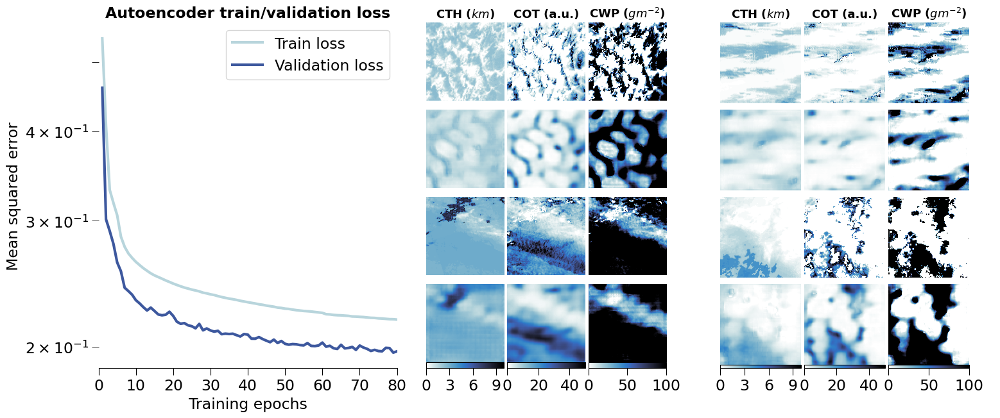

In [9]:
fig, axs = plt.subplots(1, 3, figsize=(18, 7))

fontsize_title = 17
fontsize_label = 17

# Plot loss
n_epochs = losses.shape[0]
colors = plt.get_cmap('cmr.arctic_r')([0.15, 0.60])
# Plot train/val losses
axs[0].set_title("Autoencoder train/validation loss", fontsize=fontsize_title, weight='bold')
axs[0].set_xlabel("Training epochs", fontsize=fontsize_label)
axs[0].set_ylabel("Mean squared error", fontsize=fontsize_label)
axs[0].plot(range(1, n_epochs + 1), losses['train_loss'].values, label="Train loss", color=colors[0], linewidth=3)
axs[0].plot(range(1, n_epochs + 1), losses['val_loss'].values, label="Validation loss", color=colors[1], linewidth=3)
axs[0].set_xlim([1., n_epochs])
axs[0].set_xticks(np.arange(0, n_epochs + 1, 10), np.arange(0, n_epochs + 1, 10), fontsize=fontsize_label)
axs[0].set_yscale('log')
axs[0].tick_params(axis='both', which='both', labelsize=fontsize_label, length=8)
axs[0].legend(fontsize=fontsize_label)
for axis in ['right', 'top', 'left']:
    axs[0].spines[axis].set_linewidth(0)
    
# Reconstruction samples
param_cols = ['cloud_top_pressure_1km', 'cloud_top_height_1km', 'cloud_top_temperature_1km',
              'Cloud_Optical_Thickness', 'Cloud_Water_Path', 'cloud_multilayer_phase', 'Cloud_Mask_1km']
param_names_short = ['CTT', 'CTH', 'CTP', 'COT', 'CWP']
subset = [1, 3, 4]
subset_cols = [param_cols[i] for i in subset]
subset_names_short = [param_names_short[i] for i in subset]
df_means_stds = pd.read_csv(
    DATA_DIR + 'example/means_stds_save.txt',
    header=0, skiprows=2, sep=' ', usecols=[0, 1, 2, 3, 4, 5])
Means = df_means_stds.iloc[0].values
Stds = df_means_stds.iloc[1].values
Mins = df_means_stds.iloc[2].values
Maxs = df_means_stds.iloc[3].values
param_plot = {
    param_cols[0]: {'mean': Means[0],
                    'std': Stds[0],
                    'cmap': 'cmr.rainforest',
                    'vmin': 300.,
                    'vmax': 1100.,
                    'unit': '$hPa$',
                    'ticks': [300, 600, 900]},

    param_cols[1]: {'mean': Means[1],
                    'std': Stds[1],
                    'cmap': 'cmr.arctic_r',
                    'vmin': 0.,
                    'vmax': 10000.,
                    'unit': '$km$',
                    'ticks': [0, 3000, 6000, 9000]},

    param_cols[2]: {'mean': Means[2],
                    'std': Stds[2],
                    'cmap': 'cmr.sunburst',
                    'vmin': 220.,
                    'vmax': 310.,
                    'unit': '$K$',
                    'ticks': [250, 270, 290]},

    param_cols[3]: {'mean': Means[3],
                    'std': Stds[3],
                    'cmap': 'cmr.arctic_r',
                    'vmin': 0.,
                    'vmax': 50.,
                    'unit': 'a.u.',
                    'ticks': [0, 20, 40]},

    param_cols[4]: {'mean': Means[4],
                    'std': Stds[4],
                    'cmap': 'cmr.arctic_r',
                    'vmin': 0.,
                    'vmax': 100.,
                    'unit': '$gm^{-2}$',
                    'ticks': [0, 50, 100]}

}
axs[1].axis(False)
grid1 = ImageGrid(
    fig, 132,  # similar to fig.add_subplot(141).
    nrows_ncols=(4, 3), axes_pad=0.05, label_mode="1", share_all=True,
    cbar_mode='each', cbar_location='bottom', cbar_pad=0.0, cbar_size="8%")

for i, ax in enumerate(grid1):
    sample_index = i // 6
    param_index = i % 3
    row_index = i // 3
    type_index = (i // 3) % 2
    image = tiles_input[sample_index][param_index, ...] if type_index == 0 else tiles_output[sample_index][param_index, ...]
    im = ax.imshow(
        (image * param_plot[subset_cols[param_index]]['std']) + param_plot[subset_cols[param_index]]['mean'],
        vmin=param_plot[subset_cols[param_index]]['vmin'],
        vmax=param_plot[subset_cols[param_index]]['vmax'],
        cmap=param_plot[subset_cols[param_index]]['cmap'])
    ax.axis('off')
    ax.yaxis.set_ticks([])
    ax.xaxis.set_ticks([])
    # Put parameter title on first row
    if i < 3:
        ax.set_title(
            subset_names_short[param_index] + ' ({})'.format(param_plot[subset_cols[param_index]]['unit']),
            weight='bold', fontsize=fontsize_title-4)
    # Colorbar on last row
    if i > 8:
        cax = grid1.cbar_axes[i]
        cbar = cax.colorbar(im)
        labels = np.array(param_plot[subset_cols[param_index]]['ticks'], dtype=int) / (1000 if param_index == 0 else 1)
        cbar.ax.set_xticks(
            ticks=param_plot[subset_cols[param_index]]['ticks'],
            labels=[str(int(x)) for x in labels])
        cbar.ax.tick_params(rotation=0, labelsize=fontsize_label, length=8)
    else:
        grid1.cbar_axes[i].axis(False)

axs[2].axis(False)
grid2 = ImageGrid(
    fig, 133,  # similar to fig.add_subplot(141).
    nrows_ncols=(4, 3), axes_pad=0.05, label_mode="1", share_all=True,
    cbar_mode='each', cbar_location='bottom', cbar_pad=0.0, cbar_size="4%")

for i, ax in enumerate(grid2):
    sample_index = i // 6 + 2
    param_index = i % 3
    row_index = i // 3
    type_index = (i // 3) % 2
    image = tiles_input[sample_index][param_index, ...] if type_index==0 else tiles_output[sample_index][param_index, ...]
    im = ax.imshow(
        (image * param_plot[subset_cols[param_index]]['std']) + param_plot[subset_cols[param_index]]['mean'],
        vmin=param_plot[subset_cols[param_index]]['vmin'],
        vmax=param_plot[subset_cols[param_index]]['vmax'],
        cmap=param_plot[subset_cols[param_index]]['cmap'])
    ax.axis('off')
    ax.yaxis.set_ticks([])
    ax.xaxis.set_ticks([])
    # Put parameter title on first row
    if i < 3:
        ax.set_title(
            subset_names_short[param_index] + ' ({})'.format(param_plot[subset_cols[param_index]]['unit']),
            weight='bold', fontsize=fontsize_title - 4)
    # Colorbar on last row
    if i > 8:
        cax = grid2.cbar_axes[i]
        cbar = cax.colorbar(im)
        labels = np.array(param_plot[subset_cols[param_index]]['ticks'], dtype=int) / (
            1000 if param_index == 0 else 1)
        cbar.ax.set_xticks(
            ticks=param_plot[subset_cols[param_index]]['ticks'],
            labels=[str(int(x)) for x in labels])
        cbar.ax.tick_params(rotation=0, labelsize=fontsize_label, length=8)
    else:
        grid2.cbar_axes[i].axis(False)
plt.subplots_adjust(wspace=0, hspace=0)
plt.savefig(PLOT_DIR + 'figure_3.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

### Figure 4: Spatial distribution of channel reconstruction errors aggregated on a 5 ° grid for the 2008 training, validation, test and the 2016 test datasets.

In [10]:
splits = ['train',
          'val',
          'test',
          'test_2016']
split_titles = ['Training', 'Validation', 'Test', 'Test 2016']

datasets = {
    split: xr.open_dataset(
        DATA_DIR_PLOTS + f'xarray_{split}_ae.nc') for split in splits}

# Split means (channel and global) were computed from the raw data but
# can be approximately reprocessed from the aggregated data.
split_channel_means = [[0.11108657, 0.32167547, 0.22264163],
                       [0.11237919, 0.30387641, 0.18758766],
                       [0.10834076, 0.28917891, 0.17422844],
                       [0.12064469, 0.36866025, 0.23720702]]
split_means = [0.2185, 0.2013, 0.1906, 0.2422]

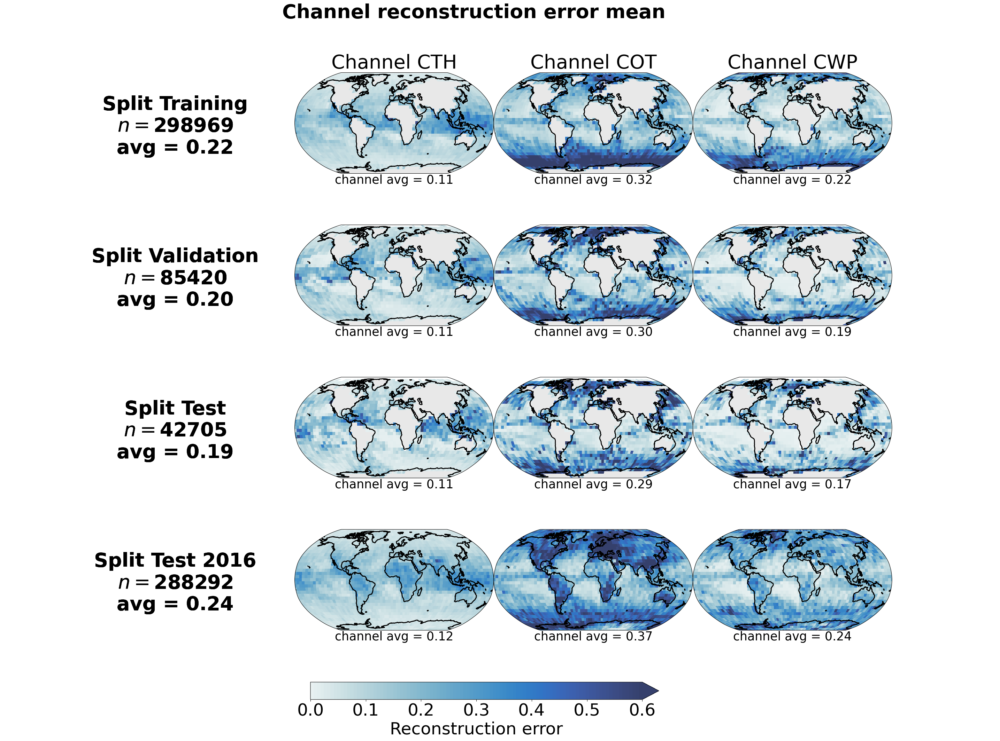

In [11]:
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=100, start=0.05, stop=0.7)

# Plotting parameters
projection = (ccrs.Robinson())
subplot_kws = {'projection': projection, 'facecolor': 'w'}
transform = ccrs.PlateCarree()
title_size = 40
vmin = 0.
vmax = 0.6

channels = datasets['train'].channel.data

# Plot
fig, axs = plt.subplots(ncols=4, nrows=len(splits), subplot_kw=subplot_kws, figsize=(30, 25),
                        width_ratios=[1.2, 1, 1, 1])
for j, channel in enumerate(channels, 0):
    # Set column title
    axs[0, j+1].set_title('Channel {}'.format(channel.upper()), fontsize=title_size)
    for i, split in enumerate(splits, 0):
        p = datasets[split][f'channel_error_mean'].sel(channel=channel).plot(
            ax=axs[i, j+1], transform=ccrs.PlateCarree(),
            vmin=vmin, vmax=vmax, add_labels=False, add_colorbar=False, cmap=cmap
        )
        axs[i, j+1].coastlines(color='black', alpha=1., lw=2.)
        axs[i, j+1].add_feature(cartopy.feature.LAND, color='lightgray', alpha=0.5)
        axs[i, j + 1].text(
            0.5, -0.1, 'channel avg = {:.2f}'.format(split_channel_means[i][j]),
            ha="center", fontsize=title_size-15, transform=axs[i, j + 1].transAxes)
        axs[i, 0].axis('off')
        axs[i, 0].text(
            0.5, 0.25, 'Split {}\n$n = ${}\navg = {:.2f}'.format(
                split_titles[i], int(datasets[split]['global_count_5deg'].sum()), split_means[i]),
            ha="center", weight='bold', fontsize=title_size, transform=axs[i, 0].transAxes)
fig.subplots_adjust(bottom=0.2, top=0.9, left=0.1, right=0.9,
                    wspace=0.0, hspace=0.0)
fig.suptitle('Channel reconstruction error mean', fontsize=title_size, weight='bold', y=0.95)
# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.05, 0.15, 0.95, 0.02])
cbar_ax.axis('off')
cb = fig.colorbar(p, ax=cbar_ax, orientation='horizontal', fraction=1, extend='max')
cb.set_label(label='Reconstruction error', fontsize=35)
cb.ax.tick_params(labelsize=35)
plt.savefig(PLOT_DIR + 'figure_4.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

## Figure 5 : Joint histogram over the test set of the surface observations and the predicted cloud scene base height from ORABAse with the ordinal regression all-threshold model. The 1:1 boxes are highlighted in orange in the figure.

In [12]:
df_test = pd.read_csv(DATA_DIR + 'test_set/df_preds_test_reg.csv', index_col=0, header=0)

In [13]:
labels = df_test['target'].values
classes = np.array([50., 100., 200., 300., 600., 1000., 1500., 2000., 2500.])
method_names = [col for col in df_test.columns if ('label' not in col or 'target' not in col)]
method = 'logistic_at'
method_name = 'Ordinal regression (all-threshold)'
preds = df_test[method].values

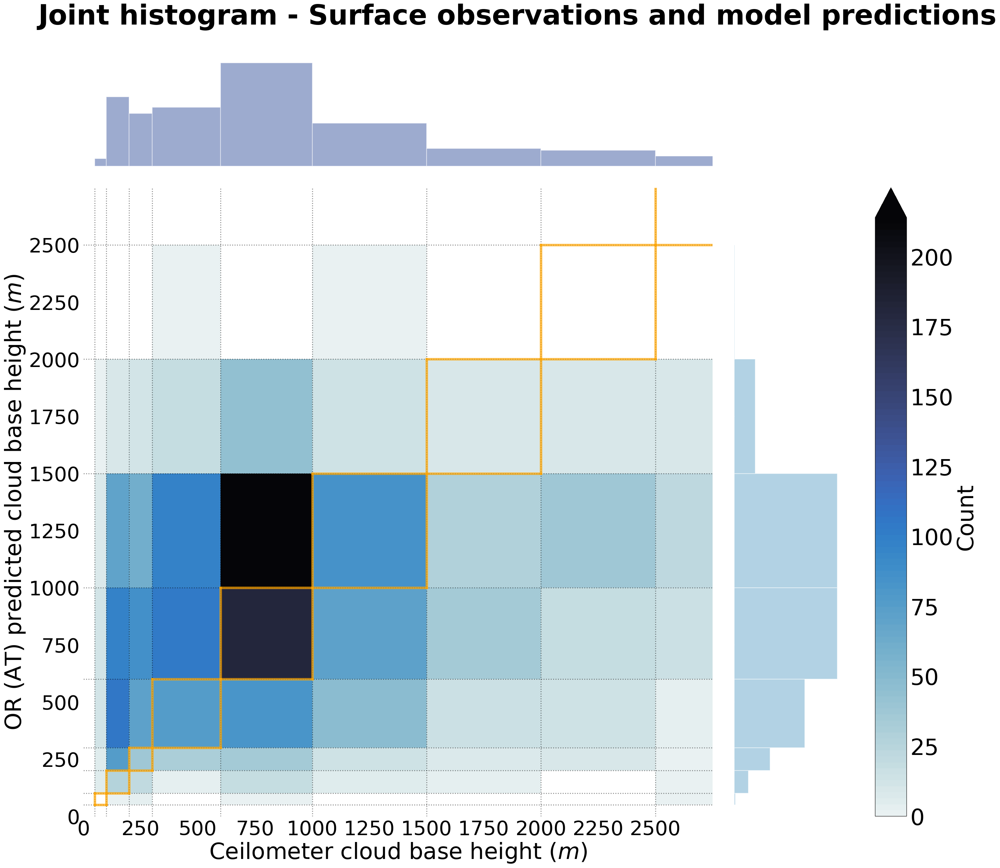

In [14]:
# Plot parameters
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=100, start=0.05, stop=0.95)
color = cmr.take_cmap_colors('cmr.arctic_r', 10, cmap_range=(0.15, 0.95), return_fmt='hex')[5]
color2 = cmr.take_cmap_colors('cmr.arctic_r', 10, cmap_range=(0.15, 0.95), return_fmt='hex')[2]
bins = classes.tolist() + [3000.]
fsize = 55
legend_size = 40
label_size = 45
ticks_size = 40
# Jointplot
plot = sns.jointplot(data=df_test, x='target', y=method,
                     height=30,
                     kind='hist',
                     cmap=cmap,
                     cbar=True,
                     joint_kws=dict(bins=bins, kde=True),
                     marginal_kws=dict(bins=bins, fill=False, kde=False),
                     hue_norm=[0, 100],
                     cbar_kws=dict(extend='max')
                     )
# Set limits
plot.ax_joint.set_xlim([0, 2750.])
plot.ax_joint.set_ylim([0, 2750.])
# Draw bin edges
for i, bin in enumerate(bins[:-1]):
    plot.ax_joint.axhline(y=bin, xmin=0, xmax=3000., lw=1.8, color='k', alpha=0.5, ls=':')
    plot.ax_joint.axvline(x=bin, ymin=0, ymax=3000., lw=1.8, color='k', alpha=0.5, ls=':')
# 1:1 blocks
for i, bin in enumerate(bins[:-1]):
    plot.ax_joint.axhline(y=bin, xmin=bin/2750, xmax=bins[i + 1]/2750, lw=5, color='orange', alpha=0.7)
    plot.ax_joint.axhline(y=bins[i + 1], xmin=bin/2750, xmax=bins[i + 1]/2750, lw=5, color='orange', alpha=0.7)
    plot.ax_joint.axvline(x=bin, ymin=bin/2750, ymax=bins[i + 1]/2750, lw=5, color='orange', alpha=0.7)
    plot.ax_joint.axvline(x=bins[i + 1], ymin=bin/2750, ymax=bins[i + 1]/2750, lw=5, color='orange', alpha=0.7)
# Setup axes of jointplot (ticks and labels)
plot.fig.axes[0].tick_params(color='white')  # width=5, length=20, direction='inout')
plot.ax_joint.set_ylabel('OR (AT) predicted cloud base height ($m$)', fontsize=label_size)
plot.ax_joint.set_yticks(np.arange(0., 2750., 250.),
                         [str(int(a)) for a in np.arange(0., 2750., 250.)],
                         fontsize=ticks_size)
plot.ax_joint.set_xlabel('Ceilometer cloud base height ($m$)', fontsize=label_size)
plot.ax_joint.set_xticks(np.arange(0., 2750., 250.),
                         [str(int(a)) for a in np.arange(0., 2750., 250.)],
                         fontsize=ticks_size)
# Setup marginals
for patch in plot.ax_marg_x.patches:
    patch.set(facecolor=color, alpha=0.5, edgecolor='white')
for patch in plot.ax_marg_y.patches:
    patch.set(facecolor=color2, alpha=0.5, edgecolor='white')
plot.ax_marg_x.tick_params(color='white')
plot.ax_marg_y.tick_params(color='white')
# Adjust plot
plt.subplots_adjust(left=0.1, right=0.8, top=0.8, bottom=0.1)
# Setup axes for colorbar
pos_joint_ax = plot.ax_joint.get_position()
pos_marg_x_ax = plot.ax_marg_x.get_position()
plot.ax_joint.set_position([pos_joint_ax.x0, pos_joint_ax.y0, pos_marg_x_ax.width, pos_joint_ax.height])
plot.fig.axes[-1].set_position([.83, pos_joint_ax.y0, .07, pos_joint_ax.height])
# Setup colorbar ticks and labels
cbar_ticks = plot.fig.axes[-1].get_yticks()
plot.fig.axes[-1]._colorbar.set_label('Count', fontsize=label_size)
plot.fig.axes[-1].set_yticklabels([int(t) for t in cbar_ticks], fontsize=label_size)
plot.fig.axes[-1].tick_params(axis='y', color='white')  # width=5, length=20, direction='inout')
for axis in ['left', 'bottom']:
    plot.ax_joint.spines[axis].set_linewidth(0)
    plot.ax_marg_x.spines[axis].set_linewidth(0)
    plot.ax_marg_y.spines[axis].set_linewidth(0)
for axis in ['right', 'top']:
    plot.ax_joint.spines[axis].set_linewidth(0)
plot.fig.suptitle('Joint histogram - Surface observations and model predictions', fontsize=fsize, y=0.85, weight='bold')
plt.tight_layout()
plt.savefig(PLOT_DIR + 'figure_5.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

## Figure 6 : Joint histogram of (a) surface observations and 2B-CLDCLASS-LIDAR retrievals, and (b) ORABase predictions and 2B-CLDCLASS-LIDAR retrievals, for the co-located cloud scenes during the year 2008. The 1:1 boxes are highlighted in the figure in orange.

In [15]:
df_preds_calipso = pd.read_csv(DATA_DIR_PLOTS + 'df_preds_calipso2008.csv', header=0, index_col=0)

In [16]:
# Re-process extracted Calipso CBH retrievals
# 0: center, 1: mean, 2: min, 3: max, 4: median, 5: std
df_preds_calipso['calipso_cbh_labels'] = df_preds_calipso['calipso_cbh_labels'].apply(literal_eval)
df_preds_calipso['calipso_label_mean'] = df_preds_calipso['calipso_cbh_labels'].apply(lambda x: x[1])
df_preds_calipso['calipso_label_min'] = df_preds_calipso['calipso_cbh_labels'].apply(lambda x: x[2])
df_preds_calipso['calipso_label_max'] = df_preds_calipso['calipso_cbh_labels'].apply(lambda x: x[3])
df_preds_calipso['calipso_label_median'] = df_preds_calipso['calipso_cbh_labels'].apply(lambda x: x[4])
df_preds_calipso['calipso_label_std'] = df_preds_calipso['calipso_cbh_labels'].apply(lambda x: x[5])

In [17]:
col_pred = 'logistic_at'
method = 'logistic_at'
method_name = 'Ordinal regression (all-threshold)'
col_obs = 'target'
col_calipso = 'calipso_label_mean'
classes = np.array([50., 100., 200., 300., 600., 1000., 1500., 2000., 2500.])
bin_classes = np.concatenate([[0], classes, [1e8]])
calipso_label_bin = bin_classes[
    len(bin_classes) - 1 - (df_preds_calipso['calipso_label_mean'].values[:, np.newaxis] < bin_classes).sum(axis=1)]
df_preds_calipso['calipso_label_mean_bin'] = np.where(
    (calipso_label_bin == 0.) | (calipso_label_bin == bin_classes[-1]), 50., calipso_label_bin)
bins = classes.tolist() + [3000.]
bins_preds = classes.tolist() + [3000.]
bins_calipso = np.arange(100., 3000., 100)

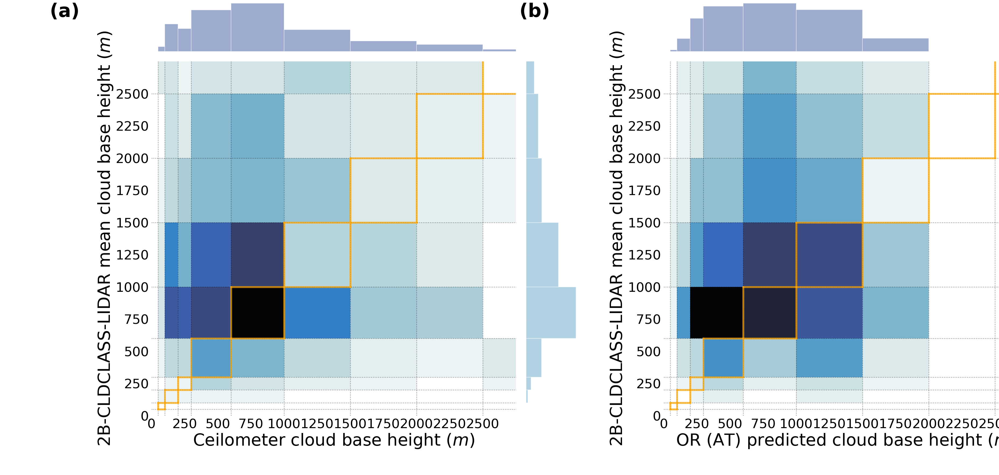

In [18]:
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=100, start=0.02, stop=0.95)
color = cmr.take_cmap_colors('cmr.arctic_r', 10, cmap_range=(0.15, 0.95), return_fmt='hex')[5]
color2 = cmr.take_cmap_colors('cmr.arctic_r', 10, cmap_range=(0.15, 0.95), return_fmt='hex')[2]
fsize = 50
legend_size = 45
label_size = 45
ticks_size = 35
df_sub3000 = df_preds_calipso[df_preds_calipso[f'calipso_label_mean'] <= 3000.]
plot1 = plot_joint_hist_cbh(labels=df_sub3000[col_obs].values,
                            preds=df_sub3000[f'calipso_label_mean_bin'].values,
                            cmap=cmap, bins=bins, method=f'2B-CLDCLASS-LIDAR mean', label_size=label_size,
                            ticks_size=ticks_size, marg_colors=[color, color2], xlabel='Ceilometer')
plot2 = plot_joint_hist_cbh(labels=df_sub3000[col_pred].values,
                            preds=df_sub3000[f'calipso_label_mean_bin'].values,
                            cmap=cmap, bins=bins, method=f'2B-CLDCLASS-LIDAR mean', label_size=label_size,
                            ticks_size=ticks_size, marg_colors=[color, color2], xlabel='OR (AT) predicted')
fig = plt.figure(figsize=(45, 20))
gs = gridspec.GridSpec(1, 2)
add_label('(a)', y=1, x=0, fontsize=50, weight='bold')
plt.gca().axis('off')
add_label('(b)', y=1, x=0.5, fontsize=50, weight='bold')
mg0 = SeabornFig2Grid(plot1, fig, gs[0])
mg1 = SeabornFig2Grid(plot2, fig, gs[1])
plt.savefig(PLOT_DIR + 'figure_6.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

## Figure 7 : Spatial distribution of (top) mean and (bottom) median absolute deviation of predicted cloud base height for MODIS data of the year 2016 aggregated on a 5° grid.

In [19]:
global_preds = xr.open_dataset(DATA_DIR + 'global_2016/global_counts_predictions_ae_ocean_2016.nc')

In [20]:
projection = (ccrs.Robinson())
subplot_kws = {'projection': projection, 'facecolor': 'w'}
transform = ccrs.PlateCarree()
threshold_count = 50
count_global_cbh = global_preds['global_count_5deg'].sum().values
method = 'logistic_at'
method_name = 'Ordinal logistic model (all-threshold variant)'
cld_base_height_count = global_preds['cbh_count_5deg_' + method]
title_size_cbh = 25
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=100, start=0.15, stop=0.95)

In [21]:
# Mean preprocess 
cld_base_height_mean = global_preds['cbh_mean_5deg_' + method]
title_size_mean = 30
# Colormap = 10 categories
# 400, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800
bounds_mean = [0, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800, 3000]
bounds_labels_mean = [400, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800]
cmap_mean = cmr.get_sub_cmap('cmr.arctic_r', N=len(bounds_labels_mean), start=0.15, stop=0.95)
cbh_mean_cat = bin_value_cat(cld_base_height_mean.where(cld_base_height_mean > 0.), bins=bounds_mean)

# MAD preprocess
cld_base_height_mad = global_preds['cbh_mad_5deg_' + method]
title_size_mad = 30
# Colormap = 10 categories
# 100, 150, 200, 250, 300, 350, 400, 450, 500, 600
bounds_mad = [0, 100, 150, 200, 250, 300, 350, 400, 450, 500, 1000]
bounds_labels_mad = [50, 100, 150, 200, 250, 300, 350, 400, 450, 500]
cmap_mad = cmr.get_sub_cmap('cmr.arctic_r', N=len(bounds_labels_mad), start=0.1, stop=0.85)
cbh_mad_cat = bin_value_cat(cld_base_height_mad, bins=bounds_mad)

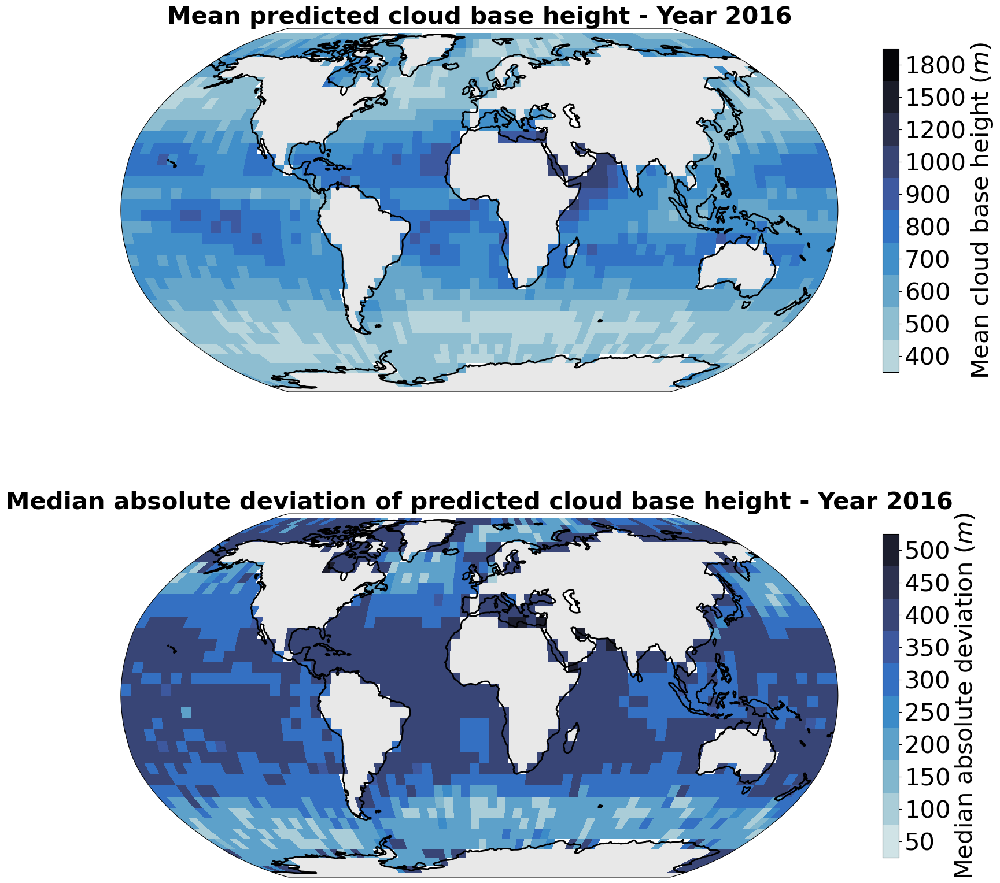

In [22]:
fig, axs = plt.subplots(ncols=1, nrows=2, subplot_kw=subplot_kws, figsize=(20, 20))
# Mean
p = cbh_mean_cat.where((cld_base_height_mean > 0.)
                       & (cld_base_height_count.sum(dim='cbh') >= 100)).plot(ax=axs[0],
                                                                             transform=ccrs.PlateCarree(),
                                                                             add_colorbar=False,
                                                                             vmin=1.,
                                                                             vmax=11.,
                                                                             cmap=cmap_mean,
                                                                             )
cb = plt.colorbar(p, orientation="vertical", pad=0.05, shrink=0.8)
cb.set_label(label='Mean cloud base height ($m$)', fontsize=30)
cb.set_ticks(np.arange(1.5, len(bounds_labels_mean) + 1.5, 1), labels=bounds_labels_mean)
cb.ax.tick_params(labelsize=30)
axs[0].set_title('Mean predicted cloud base height - Year 2016', fontsize=title_size_mean, weight='bold')
axs[0].coastlines(color='black', alpha=1., lw=2.)
axs[0].add_feature(cartopy.feature.LAND, color='lightgray', alpha=0.5)
# MAD
p = cbh_mad_cat.where(cld_base_height_count.sum(dim='cbh') >= 100).plot(ax=axs[1],
                                                                        transform=ccrs.PlateCarree(),
                                                                        add_colorbar=False,
                                                                        cmap=cmap_mad,
                                                                        vmin=1.,
                                                                        vmax=11.
                                                                        )
cb = plt.colorbar(p, orientation="vertical", pad=0.05, shrink=0.8)
cb.set_label(label='Median absolute deviation ($m$)', fontsize=30)
cb.set_ticks(np.arange(1.5, len(bounds_labels_mad) + 1.5, 1), labels=bounds_labels_mad)
cb.ax.tick_params(labelsize=30)
axs[1].set_title('Median absolute deviation of predicted cloud base height - Year 2016', fontsize=title_size_mad, weight='bold')
axs[1].coastlines(color='black', alpha=1., lw=2.)
axs[1].add_feature(cartopy.feature.LAND, color='lightgray', alpha=0.5)
plt.savefig(PLOT_DIR + 'figure_7.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

### Appendix A : Cloud base height retrievals distribution
#### Figure A.1 : Spatial distribution of cloud base height retrievals from [MetOffice 2006] for the years 2008 and 2016 on a 5° grid. Overall percentage of each label in the total observations is indicated in parentheses. Only grid cells with more than 50 retrievals are displayed.

In [23]:
year = '2008-2016'
global_obs = xr.load_dataset(DATA_DIR_PLOTS + 'global_occurences_observations_{}.nc'.format(year))
# CBH
global_obs_cbh_count = global_obs['global_count_cbh_5deg'].sum().values
count_cbh_global_obs = global_obs['cbh_count_5deg'].where(global_obs['global_count_cbh_5deg'] > 50)

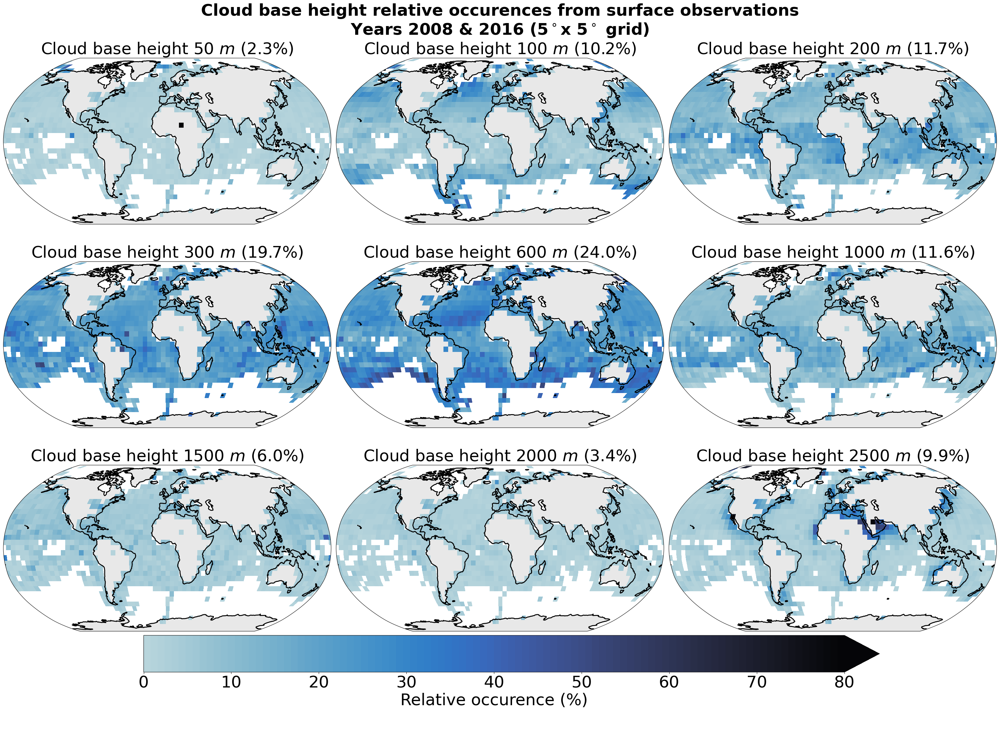

In [24]:
projection = (ccrs.Robinson())
subplot_kws = {'projection': projection, 'facecolor': 'w'}
transform = ccrs.PlateCarree()
title_size_cbh = 35
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=100, start=0.15, stop=0.95)
fig, axs = plt.subplots(ncols=3, nrows=4, subplot_kw=subplot_kws, figsize=(30, 23),
                        gridspec_kw={"height_ratios": [1, 1, 1, 0.5]})
for i, cbh in enumerate(count_cbh_global_obs.cbh.values):
    count_cloud = count_cbh_global_obs.sel(cbh=cbh).sum().values
    dataplot = 100. * count_cbh_global_obs.sel(cbh=cbh) / global_obs['global_count_cbh_5deg']
    p = dataplot.where(dataplot > 0.).plot(
        ax=axs[i // 3, i % 3], transform=ccrs.PlateCarree(),
        add_labels=False, add_colorbar=False, cmap=cmap, vmin=0., vmax=80.)
    axs[i // 3, i % 3].set_title(
        'Cloud base height {} $m$ ({:.1f}%)'.format(int(cbh), 100. * count_cloud / global_obs_cbh_count),
        fontsize=title_size_cbh)
    axs[i // 3, i % 3].coastlines(color='black', alpha=1., lw=2.)
    axs[i // 3, i % 3].add_feature(cartopy.feature.LAND, color='lightgray', alpha=0.5)
axs[3, 0].axis('off'); axs[3, 1].axis('off'); axs[3, 2].axis('off')
cb = fig.colorbar(p, ax=axs[3, :], orientation='horizontal', fraction=0.5, extend='max',)
cb.set_label(label='Relative occurence (%)', fontsize=35)
cb.ax.tick_params(labelsize=35)
fig.suptitle(
    'Cloud base height relative occurences from surface observations\nYears 2008 & 2016 (5$^\circ$x 5$^\circ$ grid)',
    fontsize=title_size_cbh, weight='bold')
plt.tight_layout()
plt.savefig(PLOT_DIR + 'appendix_A_figure_1.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

#### Figure A.2 :  Mean cloud base height from retrievals from [MetOffice 2006] for the years 2008 and 2016 on a 5° grid. Only grid cells with more than 50 retrievals are displayed.

In [25]:
cld_base_height_mean = global_obs['cbh_mean_5deg']
title_size_cbh = 35
# Colormap = 10 categories
# 400, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800
bounds = [0, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800, 3000]
bounds_labels = [400, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800]
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=len(bounds_labels), start=0.15, stop=0.95)
cbh_mean_cat = bin_value_cat(cld_base_height_mean.where(cld_base_height_mean > 0.), bins=bounds)

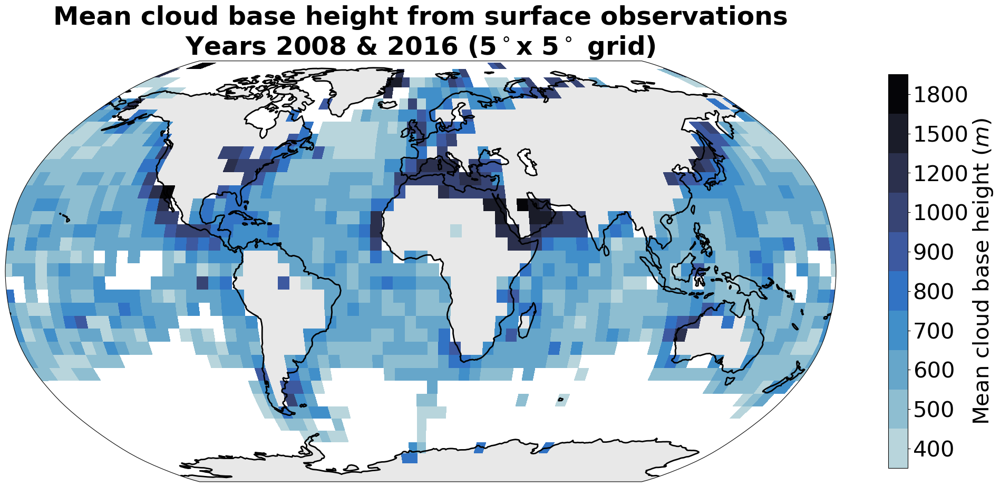

In [26]:
fig, axs = plt.subplots(ncols=1, nrows=1, subplot_kw=subplot_kws, figsize=(20, 10))
p = cbh_mean_cat.where(
    global_obs['global_count_cbh_5deg'] > 50).plot(ax=axs,
                                                   transform=ccrs.PlateCarree(),
                                                   add_colorbar=False,
                                                   vmin=1., vmax=11.,
                                                   cmap=cmap
                                                   )
cb = plt.colorbar(p, orientation="vertical", pad=0.05, shrink=0.8)
cb.set_label(label='Mean cloud base height ($m$)', fontsize=30)
cb.set_ticks(np.arange(1.5, len(bounds_labels) + 1.5, 1), labels=bounds_labels)
cb.ax.tick_params(labelsize=30)
axs.set_title(
    'Mean cloud base height from surface observations\nYears 2008 & 2016 (5$^\circ$x 5$^\circ$ grid)',
    fontsize=title_size_cbh, weight='bold')
axs.coastlines(color='black', alpha=1., lw=2.)
axs.add_feature(cartopy.feature.LAND, color='lightgray', alpha=0.5)
plt.tight_layout()
plt.savefig(PLOT_DIR + 'appendix_A_figure_2.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

#### Figure A.3 : Spatial distribution of the colocated cloud base height retrievals from [MetOffice 2006] and the satellite cloud properties used for training the prediction model for the years 2008 and 2016 on a 5° grid. Overall percentage of each label in the total dataset is indicated in parentheses.

In [27]:
global_obs = xr.load_dataset(DATA_DIR + 'plots_data/Appendix_A/global_occurences_synopmodis_cldbaseht.nc')
# CBH
global_obs_cbh_count = global_obs['global_count_cbh_5deg'].sum().values
count_cbh_global_obs = global_obs['cbh_count_5deg']

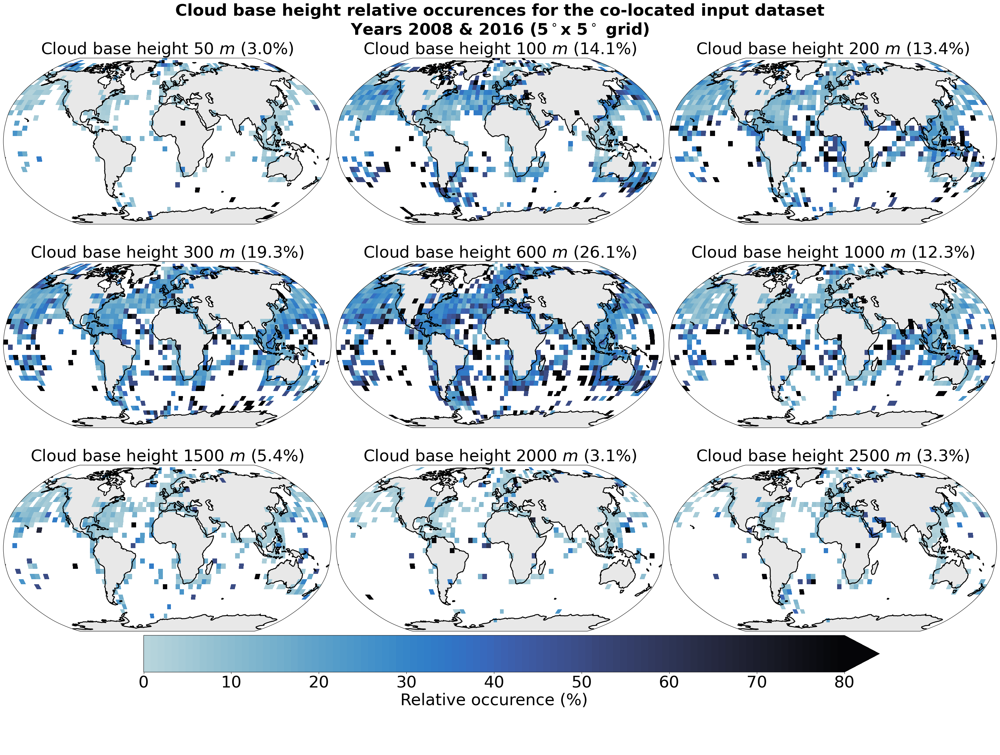

In [28]:
projection = (ccrs.Robinson())
subplot_kws = {'projection': projection, 'facecolor': 'w'}
transform = ccrs.PlateCarree()
title_size_cbh = 35
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=100, start=0.15, stop=0.95)

fig, axs = plt.subplots(ncols=3, nrows=4, subplot_kw=subplot_kws, figsize=(30, 23),
                        gridspec_kw={"height_ratios": [1, 1, 1, 0.5]})
for i, cbh in enumerate(count_cbh_global_obs.cbh.values):
    count_cloud = count_cbh_global_obs.sel(cbh=cbh).sum().values
    dataplot = 100. * count_cbh_global_obs.sel(cbh=cbh) / global_obs['global_count_cbh_5deg']
    p = dataplot.where(dataplot > 0.).plot(
        ax=axs[i // 3, i % 3], transform=ccrs.PlateCarree(),
        add_labels=False, add_colorbar=False, cmap=cmap, vmin=0., vmax=80.)
    axs[i // 3, i % 3].set_title(
        'Cloud base height {} $m$ ({:.1f}%)'.format(int(cbh), 100. * count_cloud / global_obs_cbh_count),
        fontsize=title_size_cbh)
    axs[i // 3, i % 3].coastlines(color='black', alpha=1., lw=2.)
    axs[i // 3, i % 3].add_feature(cartopy.feature.LAND, color='lightgray', alpha=0.5)
axs[3, 0].axis('off')
axs[3, 1].axis('off')
axs[3, 2].axis('off')
cb = fig.colorbar(p, ax=axs[3, :], orientation='horizontal', fraction=0.5, extend='max', )
cb.set_label(label='Relative occurence (%)', fontsize=35)
cb.ax.tick_params(labelsize=35)
fig.suptitle(
    'Cloud base height relative occurences for the co-located input dataset\nYears 2008 & 2016 (5$^\circ$x 5$^\circ$ grid)',
    fontsize=title_size_cbh, weight='bold')
plt.tight_layout()
plt.savefig(PLOT_DIR + 'appendix_A_figure_3.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

#### Figure A.4 : Mean cloud base height from the colocated retrievals from [MetOffice 2006] and the satellite cloud properties used for training the prediction model for the years 2008 and 2016 on a 5° grid.

In [29]:
cld_base_height_mean = global_obs['cbh_mean_5deg']
title_size_cbh = 35
# Colormap = 10
# 400, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800
bounds = [0, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800, 3000]
bounds_labels = [400, 500, 600, 700, 800, 900, 1000, 1200, 1500, 1800]
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=len(bounds_labels), start=0.15, stop=0.95)
cbh_mean_cat = bin_value_cat(cld_base_height_mean.where(cld_base_height_mean > 0.), bins=bounds)

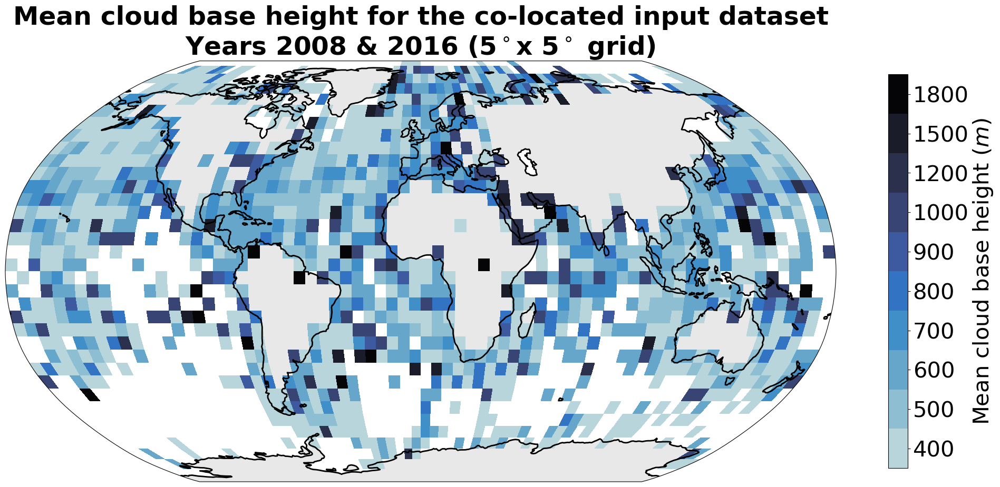

In [30]:
fig, axs = plt.subplots(ncols=1, nrows=1, subplot_kw=subplot_kws, figsize=(20, 10))
p = cbh_mean_cat.where(cld_base_height_mean > 0.).plot(ax=axs,
                                                       transform=ccrs.PlateCarree(),
                                                       add_colorbar=False,
                                                       vmin=1., vmax=11.,
                                                       cmap=cmap
                                                       )
cb = plt.colorbar(p, orientation="vertical", pad=0.05, shrink=0.8)
cb.set_label(label='Mean cloud base height ($m$)', fontsize=30)
cb.set_ticks(np.arange(1.5, len(bounds_labels) + 1.5, 1), labels=bounds_labels)
cb.ax.tick_params(labelsize=30)
axs.set_title(
    'Mean cloud base height for the co-located input dataset\nYears 2008 & 2016 (5$^\circ$x 5$^\circ$ grid)',
    fontsize=title_size_cbh, weight='bold')
axs.coastlines(color='black', alpha=1., lw=2.)
axs.add_feature(cartopy.feature.LAND, color='lightgray', alpha=0.5)
plt.tight_layout()
plt.savefig(PLOT_DIR + 'appendix_A_figure_4.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

### Appendix B : Spatio-temporal autocorrelation study
#### Figure B.1 : Reconstruction error ratios of an AE on different test datasets. The quartiles are indicated with the barplot inside each violin plot while the mean is indicated with an orange circle. 

In [31]:
splits = ['training_dataset_test',
              'test_spatial_split',
              'test_temporal_split',
              'test_spatio_temporal_split',
              'global_tiles']
split_titles = ['Random', 'Spatial', 'Temporal',
                'Spatio-temporal', 'Global 2008']
# Load reconstruction errors
reconstruction_errors = {split: np.load(DATA_DIR_PLOTS + f'Appendix_B/reconstruction_error_test_{split}_ae.npy') for split in splits}
channel_errors = {split: np.load(DATA_DIR_PLOTS + f'Appendix_B/channel_error_test_{split}_ae.npy') for split in splits}
split_sizes = {split: len(reconstruction_errors[split]) for split in splits}
# Setup data
data = list(reconstruction_errors.values())
# Compute with reference value of random
ref = data[0].mean()
wrt_ref = True
quantile_trim = True
if quantile_trim:
    qlim = 0.9
    qs = [np.quantile(data[i], qlim) for i in range(len(data))]
    data_q = [data[i][data[i] < np.quantile(data[i], qlim)] for i in range(len(data))]
data_violin = data_q if quantile_trim else data
if wrt_ref:
    data_violin[:] = [data_violin[i] / ref for i in range(len(data))]

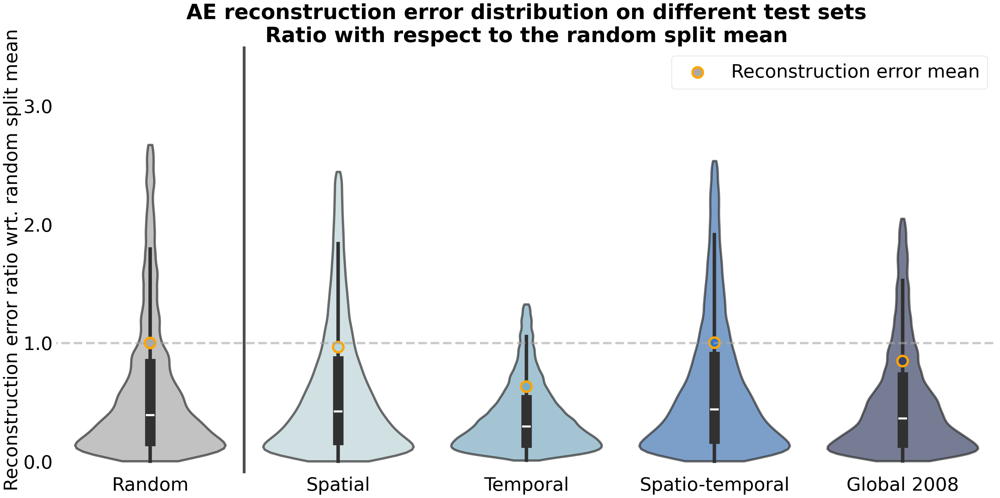

In [32]:
c_palette = plt.get_cmap('cmr.arctic_r')([0.15, 0.30, 0.50, 0.70])
colors = ['darkgray'] + list(c_palette)
c_base = colors[:1]
c_boxes = colors[-1:]
cnt = 1
lw_edge = 5.
labelsize = 40
titlesize = 45

plt.figure(figsize=(30, 15))
violin = sns.violinplot(
    data=data_violin,
    inner='box', linewidth=5., cut=0, palette=colors, bw=.1, alpha=0.7)
xmin = -1.
xmax = 5.
vline_min = 0.5
xticks_min = 0.
ax = plt.gca()
# Plot mean
ax.scatter(x=[xticks_min + cnt * k for k in range(len(split_titles))],
           y=[data[k].mean() / ref if wrt_ref else data[k].mean() for k in range(len(split_titles))],
           color=colors, s=500, edgecolors='orange', linewidths=5, zorder=2, label='Reconstruction error mean')
plt.legend(fontsize=labelsize)
# Hlines
plt.hlines(data[0].mean() / ref if wrt_ref else data[0].mean(), xmin=xmin, xmax=xmax,
           ls='--', lw=5., color=c_base[0], alpha=0.6)
# Vlines
plt.vlines(vline_min, ymin=-2., ymax=50.,
           lw=6., color='k', alpha=0.7)
# Labels
plt.xticks([xticks_min + cnt * k for k in range(len(split_titles))], split_titles, fontsize=labelsize)
plt.ylabel('Reconstruction error' + (' ratio wrt. random split mean' if wrt_ref else ''), fontsize=labelsize)
y_tick_max = 4. if wrt_ref else 6.
plt.yticks(np.arange(0, y_tick_max, 1), np.arange(0, y_tick_max, 1), fontsize=labelsize)
plt.tick_params(axis='both', color='white')
# Limits
plt.xlim([xmin + 0.5, xmax - 0.5])
plt.ylim([-0.1, 3.5 if wrt_ref else 4.5])
# Plot axis
for axis in ['left', 'bottom', 'right', 'top']:
    ax.spines[axis].set_linewidth(0)
# Title
plt.title('AE reconstruction error distribution on different test sets'
          + ('\nRatio with respect to the random split mean' if wrt_ref else ''),
          fontsize=titlesize, weight='bold')
plt.tight_layout()
plt.savefig(PLOT_DIR + 'appendix_B_figure_1.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

#### FIgure B.2 : Distribution of mean channel reconstruction errors aggregated on a 5° grid.

In [33]:
datasets = {split: xr.open_dataset(DATA_DIR_PLOTS + f'Appendix_B/xarray_test_{split}_ae.nc') for split in splits}
channels = datasets['global_tiles'].channel.data

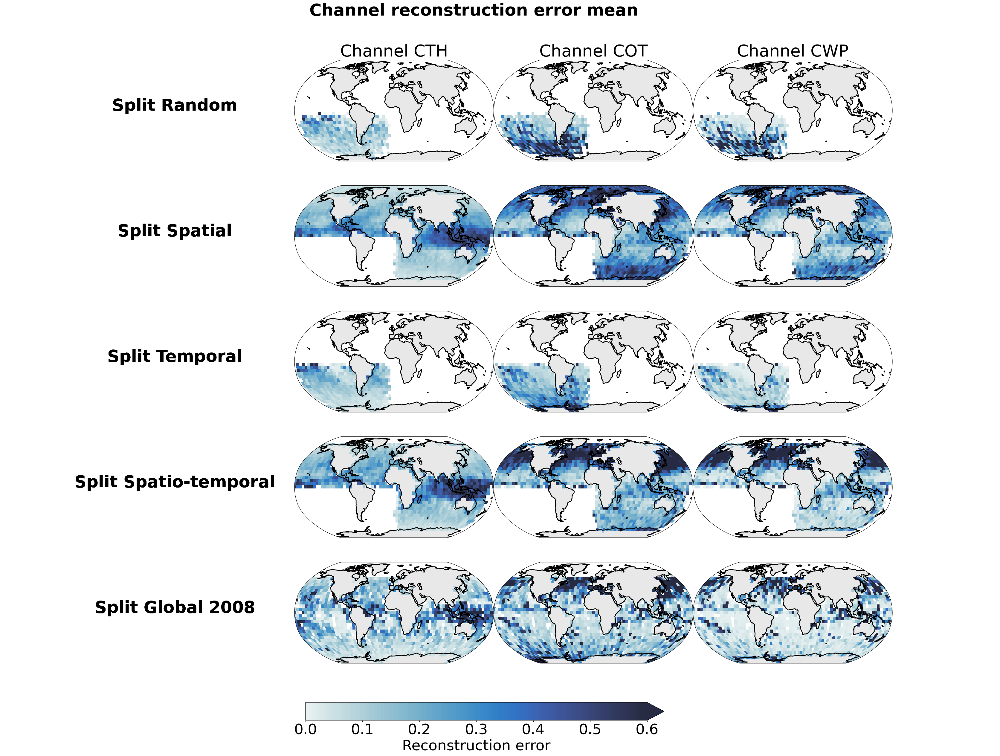

In [34]:
cmap = cmr.get_sub_cmap('cmr.arctic_r', N=100, start=0.05, stop=0.8)
# Plotting parameters
projection = (ccrs.Robinson())
subplot_kws = {'projection': projection, 'facecolor': 'w'}
transform = ccrs.PlateCarree()
title_size = 40
vmin = 0.
vmax = 0.6
# Plot
fig, axs = plt.subplots(ncols=4, nrows=5, subplot_kw=subplot_kws, figsize=(35, 30),
                        width_ratios=[1.2, 1, 1, 1])
for j, channel in enumerate(channels, 0):
    # Set column title
    axs[0, j+1].set_title('Channel {}'.format(channel.upper()), fontsize=title_size)
    for i, split in enumerate(splits, 0):
        p = datasets[split][f'channel_error_mean'].sel(channel=channel).plot(
            ax=axs[i, j+1], transform=ccrs.PlateCarree(),
            vmin=vmin, vmax=vmax, add_labels=False, add_colorbar=False, cmap=cmap
        )
        axs[i, j+1].coastlines(color='black', alpha=1., lw=2.)
        axs[i, j+1].add_feature(cartopy.feature.LAND, color='lightgray', alpha=0.5)
        axs[i, 0].axis('off')
        axs[i, 0].text(0.5, 0.5, 'Split {}'.format(split_titles[i]),
                       ha="center", weight='bold', fontsize=title_size)
fig.subplots_adjust(bottom=0.2, top=0.9, left=0.1, right=0.9,
                    wspace=0.0, hspace=0.0)
fig.suptitle('Channel reconstruction error mean', fontsize=title_size, weight='bold', y=0.95)
# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.05, 0.15, 0.95, 0.02])
cbar_ax.axis('off')
cb = fig.colorbar(p, ax=cbar_ax, orientation='horizontal', fraction=1, extend='max')
cb.set_label(label='Reconstruction error', fontsize=35)
cb.ax.tick_params(labelsize=35)
plt.savefig(PLOT_DIR + 'appendix_B_figure_2.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

### Appendix D : Ordinal regression
#### Figure D.1 :  Threshold-based setups loss function representation for a hinge penalisation, K=6 labels and target label y=5. (left) Immediate-threshold and (right) All-threshold setup loss function. (figure adapted from [Rennie 2005])

In [35]:
n_labels = 6
true_label = 4

bounds = [1., 5., 6., 8., 12.]
centers = [0., 3., 5.5, 7, 10, 14]
x_min = -1.
x_max = 15
x_ = np.linspace(x_min, x_max, 100)
lw = 4

In [36]:
def mod_hinge(x, y, bounds, all_thres=False):
    loss = np.zeros(shape=x.shape)
    for i, xs in enumerate(x, 0):
        if all_thres:
            if xs < bounds[y-1]:
                loss[i] = np.sum([(bounds[k] - xs) for k in range(0, y) if xs < bounds[k]])
            elif xs > bounds[y]:
                loss[i] = np.sum([(xs - bounds[k]) for k in range(y, len(bounds)) if xs > bounds[k]])
            else:
                loss[i] = 0.
        else:
            if xs <= bounds[y-1]:
                loss[i] = (bounds[y - 1] - xs)
            elif xs >= bounds[y]:
                loss[i] = (xs - bounds[y])
            else:
                loss[i] = 0.
    return loss

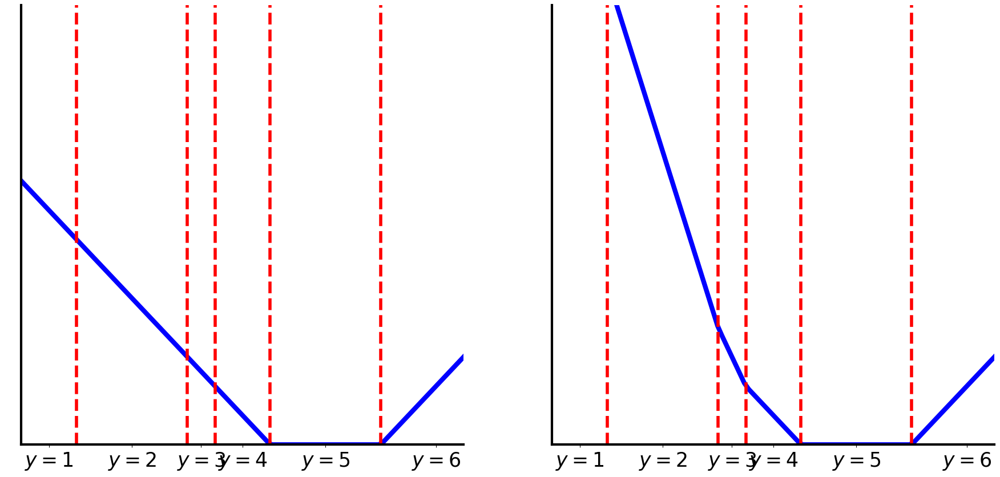

In [37]:
fig, axs = plt.subplots(ncols=2, nrows=1,
                        figsize=(22, 10))
# Immediate threshold
axs[0].plot(x_, mod_hinge(x=x_, y=true_label, bounds=bounds, all_thres=False),
            color='blue', linestyle='-', linewidth=lw+2)
axs[0].set_xlim([x_min, x_max])
axs[0].set_ylim([0., 15.])
for c in bounds:
    axs[0].axvline(x=c, ymin=0., ymax=100., color='red', linestyle='--', linewidth=lw)
axs[0].set_xticks(centers, ['$y={}$'.format(k) for k in range(1, n_labels+1)], fontsize=25)
axs[0].tick_params(axis='y', color='white')
for t in axs[0].get_yticklabels():
    t.set_color('white')
axs[0].spines[['bottom', 'left']].set_linewidth(lw-1)
axs[0].spines[['top', 'right']].set_visible(False)
# All threshold
axs[1].plot(x_, mod_hinge(x=x_, y=true_label, bounds=bounds, all_thres=True),
            color='blue', linestyle='-', linewidth=lw+2)
axs[1].set_xlim([x_min, x_max])
axs[1].set_ylim([0., 15.])
for c in bounds:
    axs[1].axvline(x=c, ymin=0., ymax=100., color='red', linestyle='--', linewidth=lw)
axs[1].set_xticks(centers, ['$y={}$'.format(k) for k in range(1, n_labels + 1)], fontsize=25)
axs[1].tick_params(axis='y', color='white')
for t in axs[1].get_yticklabels():
    t.set_color('white')
axs[1].spines[['bottom', 'left']].set_linewidth(lw-1)
axs[1].spines[['top', 'right']].set_visible(False)
# Save
plt.savefig(PLOT_DIR + 'appendix_D_figure_1.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()